# Dubai Satellite Imagery Semantic Segmentation
Humans in the Loop has published an open access dataset annotated for a joint project with the Mohammed Bin Rashid Space Center in Dubai, the UAE. 

The dataset consists of aerial imagery of Dubai obtained by MBRSC satellites and annotated with pixel-wise semantic segmentation in 6 classes. The images were segmented by the trainees of the Roia Foundation in Syria.

Original Dataset Link: https://humansintheloop.org/resources/datasets/semantic-segmentation-dataset/

# Installing & Importing Libraries

In [1]:
import pickle
import numpy as np
import pandas as pd
from PIL import Image
import albumentations as A
from IPython.display import SVG
import matplotlib.pyplot as plt
%matplotlib inline
import os, re, sys, random, shutil, cv2

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam, Nadam
from tensorflow.keras import applications, optimizers
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.applications.resnet50 import preprocess_input

from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.utils import model_to_dot, plot_model
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, CSVLogger, LearningRateScheduler
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, ZeroPadding2D, Dropout


# Data Augmentation using Albumentations Library
[Albumentations](https://albumentations.ai/) is a Python library for fast and flexible image augmentations. Albumentations efficiently implements a rich variety of image transform operations that are optimized for performance, and does so while providing a concise, yet powerful image augmentation interface for different computer vision tasks, including object classification, segmentation, and detection.

Data augmentation is done by the following techniques:

1. Random Cropping
2. Horizontal Flipping
3. Vertical Flipping
4. Rotation
5. Random Brightness & Contrast
6. Contrast Limited Adaptive Histogram Equalization (CLAHE)
7. Grid Distortion
8. Optical Distortion

In [2]:
def augment(width, height):
    transform = A.Compose([
        A.RandomCrop(width=width, height=height, p=1.0),
        A.HorizontalFlip(p=1.0),
        A.VerticalFlip(p=1.0),
        A.Rotate(limit=[60, 300], p=1.0, interpolation=cv2.INTER_NEAREST),
        A.RandomBrightnessContrast(brightness_limit=[-0.2, 0.3], contrast_limit=0.2, p=1.0),
        A.OneOf([
            A.CLAHE (clip_limit=1.5, tile_grid_size=(8, 8), p=0.5),
            A.GridDistortion(p=0.5),
            A.OpticalDistortion(distort_limit=1, shift_limit=0.5, interpolation=cv2.INTER_NEAREST, p=0.5),
        ], p=1.0),
    ], p=1.0)
    
    return transform

def visualize(image, mask, original_image=None, original_mask=None):
    fontsize = 16

    if original_image is None and original_mask is None:
        f, ax = plt.subplots(2, 1, figsize=(10, 10), squeeze=True)
        f.set_tight_layout(h_pad=5, w_pad=5)

        ax[0].imshow(image)
        ax[1].imshow(mask)
    else:
        f, ax = plt.subplots(2, 2, figsize=(16, 12), squeeze=True)
        plt.tight_layout(pad=0.2, w_pad=1.0, h_pad=0.01)

        ax[0, 0].imshow(original_image)
        ax[0, 0].set_title('Original Image', fontsize=fontsize)

        ax[1, 0].imshow(original_mask)
        ax[1, 0].set_title('Original Mask', fontsize=fontsize)

        ax[0, 1].imshow(image)
        ax[0, 1].set_title('Transformed Image', fontsize=fontsize)

        ax[1, 1].imshow(mask)
        ax[1, 1].set_title('Transformed Mask', fontsize=fontsize)
        
    plt.savefig('sample_augmented_image.png', facecolor= 'w', transparent= False, bbox_inches= 'tight', dpi= 100)

# Extract zip and cleanup filepaths

In [3]:
from pathlib import Path
from zipfile import ZipFile


## Restarts extraction process
!rm -rf dataset/Semantic_segmentation_dataset/
## 

path_to_dataset_zip = Path("dataset/Semantic-segmentation-dataset-1.zip")
assert path_to_dataset_zip.is_file(), \
"Semantic-segmentation-dataset-1.zip needs to be placed in './dataset' folder next to this file"

extract_folder = Path("dataset/")
extract_folder.mkdir(parents=True, exist_ok=True)
with ZipFile(path_to_dataset_zip, 'r') as zip_ref:
    zip_ref.extractall(extract_folder)

old_folder = Path("dataset/Semantic segmentation dataset")
assert old_folder.is_dir()
old_folder.rename(old_folder.parent / old_folder.name.replace(" ", "_"))
new_folder = old_folder.parent / old_folder.name.replace(" ", "_")

for file in new_folder.iterdir():
    if file.is_dir():
        new_name = file.name.replace(" ", "_")
        file.rename(file.parent / new_name)

# Shuffle into train and test

In [4]:
import random
import shutil
import subprocess

image_paths = list()
for tile in sorted(new_folder.iterdir()):
    if tile.is_dir():
        if "Tile" in tile.name:
            [image_paths.append(path) for path in (tile / "images").iterdir()]

images_and_masks = [(image_path, Path(image_path.__str__().replace("images", "masks").replace("jpg","png"))) for image_path in image_paths]
random.shuffle(images_and_masks)

## DANGER
test_samples = int(len(images_and_masks)*0.15)
train_save_path = Path(*new_folder.parts[:2]) / "train"
test_save_path = Path(*new_folder.parts[:2]) / "test"
(train_save_path / "images").mkdir(parents=True, exist_ok=True)
(train_save_path / "masks").mkdir(parents=True, exist_ok=True)
(test_save_path / "images").mkdir(parents=True, exist_ok=True)
(test_save_path / "masks").mkdir(parents=True, exist_ok=True)

for index, (image_path, mask_path) in enumerate(images_and_masks):

    train_or_test_base = test_save_path
    if index >= test_samples:
        train_or_test_base = train_save_path

    tile_part = image_path.parts[2].replace("Tile_", "t")
    name_part = image_path.stem.replace('image_', '')


    copied_image = train_or_test_base / "images" / f"{tile_part}_{name_part}{image_path.suffix}"
    copied_mask = train_or_test_base / "masks" / f"{tile_part}_{name_part}{mask_path.suffix}"

    shutil.copy(image_path, copied_image)
    shutil.copy(mask_path, copied_mask)


tot_number_of_images = subprocess.check_output(f"find {train_save_path.__str__()} {test_save_path.__str__()} -type f | grep images | wc -l", shell=True, text=True).strip()
NUMBER_OF_IMAGES_IN_DATASET = 72
assert int(tot_number_of_images) == NUMBER_OF_IMAGES_IN_DATASET, f"{tot_number_of_images}"
number_of_test_images = subprocess.check_output(f"find {test_save_path.__str__()} -type f | grep images | wc -l", shell=True, text=True).strip()
assert int(number_of_test_images) == test_samples





In [5]:
import subprocess
result = subprocess.run("cd dataset/Semantic_segmentation_dataset/test/images/ && mkdir -p train && mv *jpg train", capture_output=True, text=True, shell=True)
print(result)
result = subprocess.run("cd dataset/Semantic_segmentation_dataset/test/masks/ && mkdir -p train && mv *png train", capture_output=True, text=True, shell=True)
print(result)
result = subprocess.run("cd dataset/Semantic_segmentation_dataset/train/masks/ && mkdir -p train && mv *png train", capture_output=True, text=True, shell=True)
print(result)
result = subprocess.run("cd dataset/Semantic_segmentation_dataset/train/images/ && mkdir -p train && mv *jpg train", capture_output=True, text=True, shell=True)
print(result)

CompletedProcess(args='cd dataset/Semantic_segmentation_dataset/test/images/ && mkdir -p train && mv *jpg train', returncode=0, stdout='', stderr='')
CompletedProcess(args='cd dataset/Semantic_segmentation_dataset/test/masks/ && mkdir -p train && mv *png train', returncode=0, stdout='', stderr='')
CompletedProcess(args='cd dataset/Semantic_segmentation_dataset/train/masks/ && mkdir -p train && mv *png train', returncode=0, stdout='', stderr='')
CompletedProcess(args='cd dataset/Semantic_segmentation_dataset/train/images/ && mkdir -p train && mv *jpg train', returncode=0, stdout='', stderr='')


(PosixPath('dataset/Semantic_segmentation_dataset/Tile_1/images/image_part_006.jpg'), PosixPath('dataset/Semantic_segmentation_dataset/Tile_1/masks/image_part_006.png'))


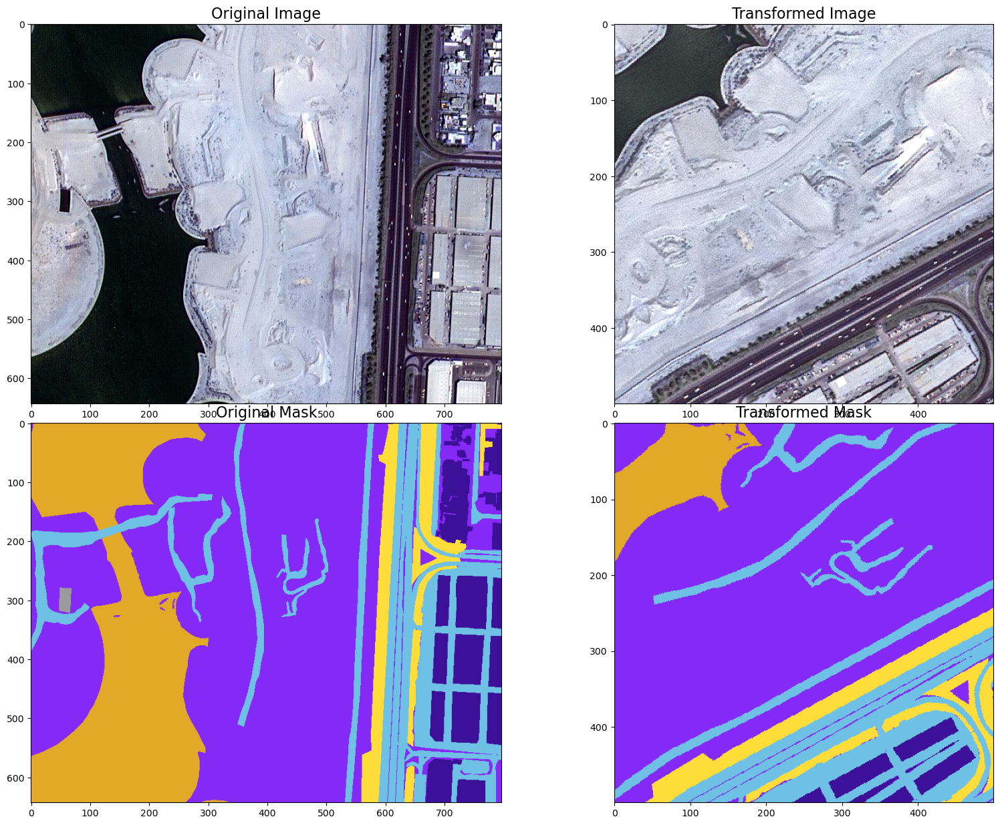

In [6]:
image_and_mask = images_and_masks[3]
print(image_and_mask)

image = cv2.imread(image_and_mask[0].__str__())
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
mask = cv2.imread(image_and_mask[1].__str__())
mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)

transform = augment(500, 500)
transformed = transform(image=image, mask=mask)
transformed_image = transformed['image']
transformed_mask = transformed['mask']


visualize(transformed_image, transformed_mask, image, mask)

# Saving Augmented Images to Disk
I have already performed data augmentation and saved the images. I am not running it's code in this notebook. It is a very time consuming process, so be patient while the code cell runs!

In [7]:
!mkdir aug_images
!mkdir aug_masks

mkdir: cannot create directory ‘aug_images’: File exists
mkdir: cannot create directory ‘aug_masks’: File exists


In [8]:
images_dir = train_save_path / "images" 
masks_dir = train_save_path / "masks"

In [9]:
def augment_dataset(count):
    '''Function for data augmentation
        Input:
            count - total no. of images after augmentation = initial no. of images * count
        Output:
            writes augmented images (input images & segmentation masks) to the working directory
    '''
    transform_1 = augment(512, 512)
    transform_2 = augment(480, 480)
    transform_3 = augment(512, 512)
    transform_4 = augment(800, 800)
    transform_5 = augment(1024, 1024)
    transform_6 = augment(800, 800)
    transform_7 = augment(1600, 1600)
    transform_8 = augment(1920, 1280)
    
    i = 0
    for i in range(count):
        for image_path in (train_save_path / "images").iterdir():
            img = cv2.imread(image_path.__str__())
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            mask = cv2.imread(image_path.with_suffix(".png").__str__().replace("images", "masks"))
            mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)

            if 't1' in image_path.name:
                transformed = transform_1(image=img, mask=mask)
                transformed_image = transformed['image']
                transformed_mask = transformed['mask']
            elif 't2' in image_path.name:
                transformed = transform_2(image=img, mask=mask)
                transformed_image = transformed['image']
                transformed_mask = transformed['mask']
            elif 't3' in image_path.name:
                transformed = transform_3(image=img, mask=mask)
                transformed_image = transformed['image']
                transformed_mask = transformed['mask']
            elif 't4' in image_path.name:
                transformed = transform_4(image=img, mask=mask)
                transformed_image = transformed['image']
                transformed_mask = transformed['mask']
            elif 't5' in image_path.name:
                transformed = transform_5(image=img, mask=mask)
                transformed_image = transformed['image']
                transformed_mask = transformed['mask']
            elif 't6' in image_path.name:
                transformed = transform_6(image=img, mask=mask)
                transformed_image = transformed['image']
                transformed_mask = transformed['mask']
            elif 't7' in image_path.name:
                transformed = transform_7(image=img, mask=mask)
                transformed_image = transformed['image']
                transformed_mask = transformed['mask']
            elif 't8' in image_path.name:
                transformed = transform_8(image=img, mask=mask)
                transformed_image = transformed['image']
                transformed_mask = transformed['mask']
            else:
                assert False
                
            cv2.imwrite(f'./aug_images/aug_{str(i+1)+image_path.name}',cv2.cvtColor(transformed_image, cv2.COLOR_BGR2RGB))
            cv2.imwrite(f'./aug_masks/aug_{str(i+1)+image_path.with_suffix(".png").name}',cv2.cvtColor(transformed_mask, cv2.COLOR_BGR2RGB))

In [10]:
#augment_dataset(8)

In [11]:
# !zip -r aug_images.zip './aug_images/'
# !zip -r aug_masks.zip './aug_masks/'

In [12]:
# !rm -rf './aug_images/'
# !rm -rf './aug_masks/'

# Working with Augmented Dataset

In [13]:

train_images = train_save_path / "images"
train_masks = train_save_path / "masks"
val_images = test_save_path / "images"
val_masks = test_save_path / "masks"

In [14]:
file_names = np.sort(os.listdir(train_images.__str__())) 
file_names = np.char.split(file_names, '.')
filenames = np.array([])
for i in range(len(file_names)):
    filenames = np.append(filenames, file_names[i][0])
filenames

array(['train'], dtype='<U32')

In [15]:
def show_data(files, original_images_dir, label_images_dir):

    for file in files:
        fig, axs = plt.subplots(1, 2, figsize=(15, 6), constrained_layout=True)
        
        axs[0].imshow(cv2.resize(cv2.imread(original_images_dir+'train/'+str(file)+'.jpg'), (2000,1400)))
        axs[0].set_title('Original Image', fontdict = {'fontsize':14, 'fontweight': 'medium'})
        axs[0].set_xticks(np.arange(0, 2001, 200))
        axs[0].set_yticks(np.arange(0, 1401, 200))
        axs[0].grid(False)
        axs[0].axis(True)

        semantic_label_image = cv2.imread(label_images_dir+ 'train/'+str(file)+'.png')
        semantic_label_image = cv2.cvtColor(semantic_label_image, cv2.COLOR_BGR2RGB)
        semantic_label_image = cv2.resize(semantic_label_image, (2000,1400))
        axs[1].imshow(semantic_label_image)
        axs[1].set_title('Semantic Segmentation Mask', fontdict = {'fontsize':14, 'fontweight': 'medium'})
        axs[1].set_xticks(np.arange(0, 2001, 200))
        axs[1].set_yticks(np.arange(0, 1401, 200))
        axs[1].grid(False)
        axs[1].axis(True)

        plt.savefig('./sample_'+file, facecolor= 'w', transparent= False, bbox_inches= 'tight', dpi= 100)
        plt.show()

        
# files = ['image_t4_001', 'image_t4_005', 'image_t6_002', 'image_t7_002', 'image_t8_003', 'image_t8_004', 'image_t8_006']    
# show_data(files, train_images, train_masks)    

In [16]:
# augmented_files = ['image_t1_002', 'image_t3_002', 'image_t4_006', 'image_t5_004', 'image_t6_007']
# dims = np.array([(512, 512), (512, 512), (800, 800), (800, 800), (800, 800)])

def show_augmented_images(files, original_images_dir, label_images_dir):
    dim_index = 0
    for file in files:
        count_img = 1
        count_msk = 1
        fig, axs = plt.subplots(3, 6, figsize=(25, 12), constrained_layout=True)
        for i in range(3):
            for j in range(6):
                if i == 0 and j == 0:
                    axs[i][j].imshow(cv2.resize(cv2.cvtColor(cv2.imread(original_images_dir+'train/'+str(file)+'.jpg'), cv2.COLOR_BGR2RGB), tuple(dims[dim_index])))
                    axs[i][j].set_title('Original Image: {}.jpg'.format(file), fontdict = {'fontsize':12, 'fontweight': 'medium'})
                    axs[i][j].set_xticks(np.arange(0, dims[dim_index][0]+1, 100))
                    axs[i][j].set_yticks(np.arange(0, dims[dim_index][1]+1, 100))
                    axs[i][j].grid(False)
                    axs[i][j].axis(True)
                elif i == 0 and j == 1:
                    axs[i][j].imshow(cv2.resize(cv2.cvtColor(cv2.imread(label_images_dir+'train/'+str(file)+'.png'), cv2.COLOR_BGR2RGB), tuple(dims[dim_index])))
                    axs[i][j].set_title('Original Mask: {}.png'.format(file), fontdict = {'fontsize':12, 'fontweight': 'medium'})
                    axs[i][j].set_xticks(np.arange(0, dims[dim_index][0]+1, 100))
                    axs[i][j].set_yticks(np.arange(0, dims[dim_index][1]+1, 100))
                    axs[i][j].grid(False)
                    axs[i][j].axis(True)
                else:
                    if j%2 == 0:
                        axs[i][j].imshow(cv2.resize(cv2.cvtColor(cv2.imread(original_images_dir+'train/aug_'+str(count_img)+'_'+str(file)+'.jpg'), cv2.COLOR_BGR2RGB), tuple(dims[dim_index])))
                        axs[i][j].set_title('Augmented Image: aug_{}.jpg'.format(str(count_img)+'_'+str(file)), fontdict = {'fontsize':12, 'fontweight': 'medium'})
                        axs[i][j].set_xticks(np.arange(0, dims[dim_index][0]+1, 100))
                        axs[i][j].set_yticks(np.arange(0, dims[dim_index][1]+1, 100))
                        axs[i][j].grid(False)
                        axs[i][j].axis(True)
                        count_img += 1
                    elif j%2 != 0:
                        axs[i][j].imshow(cv2.resize(cv2.cvtColor(cv2.imread(label_images_dir+'train/aug_'+str(count_msk)+'_'+str(file)+'.png'), cv2.COLOR_BGR2RGB), tuple(dims[dim_index])))
                        axs[i][j].set_title('Augmented Mask: aug_{}.png'.format(str(count_msk)+'_'+str(file)), fontdict = {'fontsize':12, 'fontweight': 'medium'})
                        axs[i][j].set_xticks(np.arange(0, dims[dim_index][0]+1, 100))
                        axs[i][j].set_yticks(np.arange(0, dims[dim_index][1]+1, 100))
                        axs[i][j].grid(False)
                        axs[i][j].axis(True)
                        count_msk += 1

        plt.savefig('aug_image_'+file, facecolor= 'w', transparent= False, bbox_inches= 'tight', dpi= 100)
        dim_index += 1
        plt.show()

#show_augmented_images(augmented_files, train_images, train_masks)

In [17]:
# class_dict_df = pd.read_csv((train_save_path.parent / "class_dict.csv").__str__(), index_col=False, skipinitialspace=True)
# class_dict_df
class_dict = [
    {"name": "Building", "r": 60, "g": 16, "b": 152},
    {"name": "Land", "r": 132, "g": 41, "b": 246},
    {"name": "Road", "r": 110, "g": 193, "b": 228},
    {"name": "Vegetation", "r": 254, "g": 221, "b": 58},
    {"name": "Water", "r": 226, "g": 169, "b": 41},
    {"name": "Unlabeled", "r": 155, "g": 155, "b": 155}
]

# Convert the list of dictionaries to a DataFrame
class_dict_df = pd.DataFrame(class_dict)

In [18]:
label_names= list(class_dict_df.name)
label_codes = []
r= np.asarray(class_dict_df.r)
g= np.asarray(class_dict_df.g)
b= np.asarray(class_dict_df.b)

for i in range(len(class_dict_df)):
    label_codes.append(tuple([r[i], g[i], b[i]]))
    
label_codes, label_names

([(60, 16, 152),
  (132, 41, 246),
  (110, 193, 228),
  (254, 221, 58),
  (226, 169, 41),
  (155, 155, 155)],
 ['Building', 'Land', 'Road', 'Vegetation', 'Water', 'Unlabeled'])

# Create Useful Label & Code Conversion Dictionaries

These will be used for:

* One hot encoding the mask labels for model training
* Decoding the predicted labels for interpretation and visualization

In [19]:
code2id = {v:k for k,v in enumerate(label_codes)}
id2code = {k:v for k,v in enumerate(label_codes)}

name2id = {v:k for k,v in enumerate(label_names)}
id2name = {k:v for k,v in enumerate(label_names)}

In [20]:
id2code

{0: (60, 16, 152),
 1: (132, 41, 246),
 2: (110, 193, 228),
 3: (254, 221, 58),
 4: (226, 169, 41),
 5: (155, 155, 155)}

In [21]:
id2name

{0: 'Building',
 1: 'Land',
 2: 'Road',
 3: 'Vegetation',
 4: 'Water',
 5: 'Unlabeled'}

# Define Functions for One Hot Encoding RGB Labels & Decoding Encoded Predictions

In [22]:
def rgb_to_onehot(rgb_image, colormap = id2code):
    '''Function to one hot encode RGB mask labels
        Inputs: 
            rgb_image - image matrix (eg. 256 x 256 x 3 dimension numpy ndarray)
            colormap - dictionary of color to label id
        Output: One hot encoded image of dimensions (height x width x num_classes) where num_classes = len(colormap)
    '''
    num_classes = len(colormap)
    shape = rgb_image.shape[:2]+(num_classes,)
    encoded_image = np.zeros( shape, dtype=np.int8 )
    for i, cls in enumerate(colormap):
        encoded_image[:,:,i] = np.all(rgb_image.reshape( (-1,3) ) == colormap[i], axis=1).reshape(shape[:2])
    return encoded_image


def onehot_to_rgb(onehot, colormap = id2code):
    '''Function to decode encoded mask labels
        Inputs: 
            onehot - one hot encoded image matrix (height x width x num_classes)
            colormap - dictionary of color to label id
        Output: Decoded RGB image (height x width x 3) 
    '''
    single_layer = np.argmax(onehot, axis=-1)
    output = np.zeros( onehot.shape[:2]+(3,) )
    for k in colormap.keys():
        output[single_layer==k] = colormap[k]
    return np.uint8(output)

# Creating Custom Image Data Generators
## Defining Data Generators

In [23]:
# Normalizing only frame images, since masks contain label info
data_gen_args = dict(rescale=1./255)
mask_gen_args = dict()

train_frames_datagen = ImageDataGenerator(**data_gen_args)
train_masks_datagen = ImageDataGenerator(**mask_gen_args)
val_frames_datagen = ImageDataGenerator(**data_gen_args)
val_masks_datagen = ImageDataGenerator(**mask_gen_args)

# Seed defined for aligning images and their masks
seed = 1

# Custom Image Data Generators for Creating Batches of Frames and Masks

In [25]:
def TrainAugmentGenerator(train_images_dir, train_masks_dir, seed = 1, batch_size = 8, target_size = (512, 512)):
    '''Train Image data generator
        Inputs: 
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
            train_images_dir - train images directory
            train_masks_dir - train masks directory
            target_size - tuple of integers (height, width)
            
        Output: Decoded RGB image (height x width x 3) 
    '''
    train_image_generator = train_frames_datagen.flow_from_directory(
    train_images_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)

    train_mask_generator = train_masks_datagen.flow_from_directory(
    train_masks_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)

    while True:
        X1i = train_image_generator.next()
        X2i = train_mask_generator.next()
        
        #One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[0][x,:,:,:], id2code) for x in range(X2i[0].shape[0])]
        
        yield X1i[0], np.asarray(mask_encoded)

def ValAugmentGenerator(val_images_dir, val_masks_dir, seed = 1, batch_size = 8, target_size = (512, 512)):
    '''Validation Image data generator
        Inputs: 
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
            val_images_dir - validation images directory
            val_masks_dir - validation masks directory
            target_size - tuple of integers (height, width)
            
        Output: Decoded RGB image (height x width x 3) 
    '''
    val_image_generator = val_frames_datagen.flow_from_directory(
    val_images_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)


    val_mask_generator = val_masks_datagen.flow_from_directory(
    val_masks_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)


    while True:
        X1i = val_image_generator.next()
        X2i = val_mask_generator.next()

        
        
        #One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[0][x,:,:,:], id2code) for x in range(X2i[0].shape[0])]
        
        yield X1i[0], np.asarray(mask_encoded)

# Model

In [26]:
batch_size = 16
print(train_images)
num_train_samples = len(list(train_images.iterdir()))
num_val_samples = len(list(val_images.iterdir()))
steps_per_epoch = np.ceil(float(num_train_samples) / float(batch_size))
print('steps_per_epoch: ', steps_per_epoch)
validation_steps = np.ceil(float(4 * num_val_samples) / float(batch_size))
print('validation_steps: ', validation_steps)

dataset/Semantic_segmentation_dataset/train/images
steps_per_epoch:  1.0
validation_steps:  1.0


## InceptionResNetV2 UNet

In [27]:
def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def build_inception_resnetv2_unet(input_shape):
    """ Input """
    inputs = Input(input_shape)

    """ Pre-trained InceptionResNetV2 Model """
    encoder = InceptionResNetV2(include_top=False, weights="imagenet", input_tensor=inputs)

    """ Encoder """
    s1 = encoder.get_layer("input_1").output           ## (512 x 512)

    s2 = encoder.get_layer("activation").output        ## (255 x 255)
    s2 = ZeroPadding2D(( (1, 0), (1, 0) ))(s2)         ## (256 x 256)

    s3 = encoder.get_layer("activation_3").output      ## (126 x 126)
    s3 = ZeroPadding2D((1, 1))(s3)                     ## (128 x 128)

    s4 = encoder.get_layer("activation_74").output      ## (61 x 61)
    s4 = ZeroPadding2D(( (2, 1),(2, 1) ))(s4)           ## (64 x 64)

    """ Bridge """
    b1 = encoder.get_layer("activation_161").output     ## (30 x 30)
    b1 = ZeroPadding2D((1, 1))(b1)                      ## (32 x 32)

    """ Decoder """
    d1 = decoder_block(b1, s4, 512)                     ## (64 x 64)
    d2 = decoder_block(d1, s3, 256)                     ## (128 x 128)
    d3 = decoder_block(d2, s2, 128)                     ## (256 x 256)
    d4 = decoder_block(d3, s1, 64)                      ## (512 x 512)
    
    """ Output """
    dropout = Dropout(0.3)(d4)
    outputs = Conv2D(6, 1, padding="same", activation="softmax")(dropout)

    model = Model(inputs, outputs, name="InceptionResNetV2-UNet")
    return model

In [28]:
K.clear_session()

def dice_coef(y_true, y_pred):
    return (2. * K.sum(y_true * y_pred) + 1.) / (K.sum(y_true) + K.sum(y_pred) + 1.)

model = build_inception_resnetv2_unet(input_shape = (512, 512, 3))
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=[dice_coef, "accuracy"])
model.summary()

Model: "InceptionResNetV2-UNet"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 512, 512, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 255, 255, 32)         864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 255, 255, 32)         96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 255, 255, 32)         0         ['batch_n

In [29]:
# SVG(model_to_dot(model).create(prog='dot', format='svg'))
# plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True, expand_nested=True)

ImportError: You must install pydot (`pip install pydot`) for model_to_dot to work.

In [30]:
def exponential_decay(lr0, s):
    def exponential_decay_fn(epoch):
        return lr0 * 0.1 **(epoch / s)
    return exponential_decay_fn

exponential_decay_fn = exponential_decay(0.0001, 60)

lr_scheduler = LearningRateScheduler(
    exponential_decay_fn,
    verbose=1
)

checkpoint = ModelCheckpoint(
    filepath = 'InceptionResNetV2-UNet.h5',
    save_best_only = True, 
#     save_weights_only = False,
    monitor = 'val_loss', 
    mode = 'auto', 
    verbose = 1
)

earlystop = EarlyStopping(
    monitor = 'val_loss', 
    min_delta = 0.001, 
    patience = 12, 
    mode = 'auto', 
    verbose = 1,
    restore_best_weights = True
)

csvlogger = CSVLogger(
    filename= "model_training.csv",
    separator = ",",
    append = False
)

callbacks = [checkpoint, earlystop, csvlogger, lr_scheduler]

In [32]:
## Folder structure is currently bad since, I changed to strucure
train_images_str = train_images.__str__()
train_masks_str = train_masks.__str__()
val_images_str = val_images.__str__()
val_masks_str = val_masks.__str__()

history = model.fit(
    TrainAugmentGenerator(train_images_str, train_masks_str, target_size = (512, 512)), 
    steps_per_epoch=steps_per_epoch,
    validation_data = ValAugmentGenerator(val_images_str, val_masks_str, target_size = (512, 512)), 
    validation_steps = validation_steps, 
    epochs = 1,
    callbacks=callbacks,
    use_multiprocessing=False,
    verbose=1
)

Found 62 images belonging to 1 classes.
Found 62 images belonging to 1 classes.

Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
1/1 [==============================] - ETA: 0s - loss: 2.3834 - dice_coef: 0.1331 - accuracy: 0.0980Found 10 images belonging to 1 classes.
Found 10 images belonging to 1 classes.

Epoch 1: val_loss improved from inf to 1.86677, saving model to InceptionResNetV2-UNet.h5


/nix/store/9bs4h2abwqjy98qyllh1lfi3fys04ncs-python3.11-keras-2.14.0/lib/python3.11/site-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1/1 [==============================] - 44s 44s/step - loss: 2.3834 - dice_coef: 0.1331 - accuracy: 0.0980 - val_loss: 1.8668 - val_dice_coef: 0.1556 - val_accuracy: 0.0651 - lr: 1.0000e-04


In [33]:
df_result = pd.DataFrame(history.history)
df_result

,loss,dice_coef,accuracy,val_loss,val_dice_coef,val_accuracy,lr
0,2.383362,0.133148,0.097962,1.866773,0.155587,0.065132,0.0001


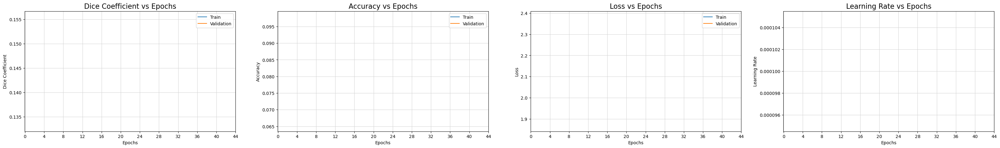

In [34]:
fig, ax = plt.subplots(1, 4, figsize=(40, 5))
ax = ax.ravel()
metrics = ['Dice Coefficient', 'Accuracy', 'Loss', 'Learning Rate']

for i, met in enumerate(['dice_coef', 'accuracy', 'loss', 'lr']): 
    if met != 'lr':
        ax[i].plot(history.history[met])
        ax[i].plot(history.history['val_' + met])
        ax[i].set_title('{} vs Epochs'.format(metrics[i]), fontsize=16)
        ax[i].set_xlabel('Epochs')
        ax[i].set_ylabel(metrics[i])
        ax[i].set_xticks(np.arange(0,45,4))
        ax[i].legend(['Train', 'Validation'])
        ax[i].xaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
        ax[i].yaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
    else:
        ax[i].plot(history.history[met])
        ax[i].set_title('{} vs Epochs'.format(metrics[i]), fontsize=16)
        ax[i].set_xlabel('Epochs')
        ax[i].set_ylabel(metrics[i])
        ax[i].set_xticks(np.arange(0,45,4))
        ax[i].xaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
        ax[i].yaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
        
plt.savefig('model_metrics_plot.png', facecolor= 'w',transparent= False, bbox_inches= 'tight', dpi= 150)

In [35]:
model.load_weights("./InceptionResNetV2-UNet.h5")

In [36]:
testing_gen = ValAugmentGenerator(val_images_dir = val_images, val_masks_dir = val_masks, target_size = (512, 512))

In [37]:
!mkdir predictions

Found 10 images belonging to 1 classes.
Found 10 images belonging to 1 classes.
1/1 [==============================] - 7s 7s/step


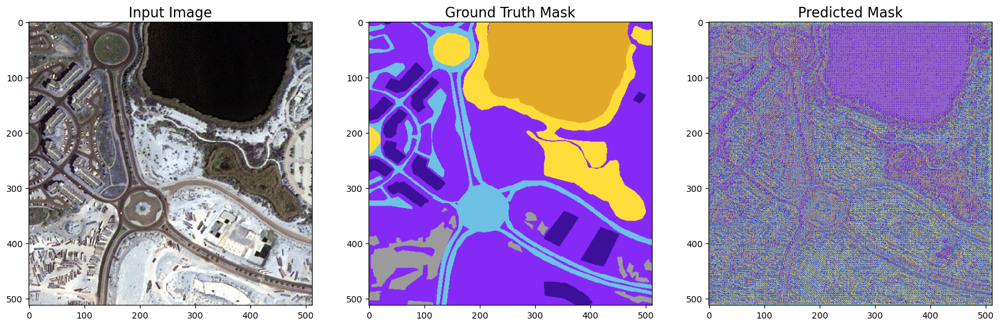

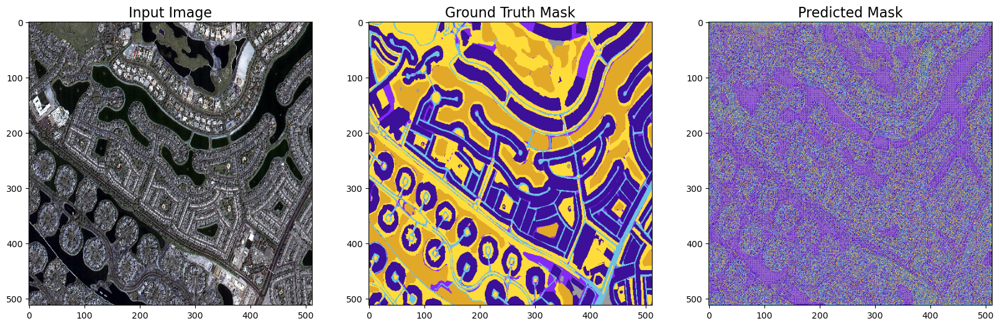

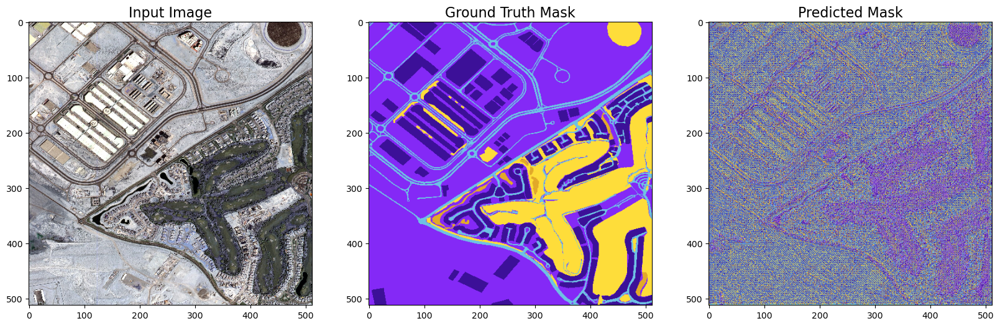

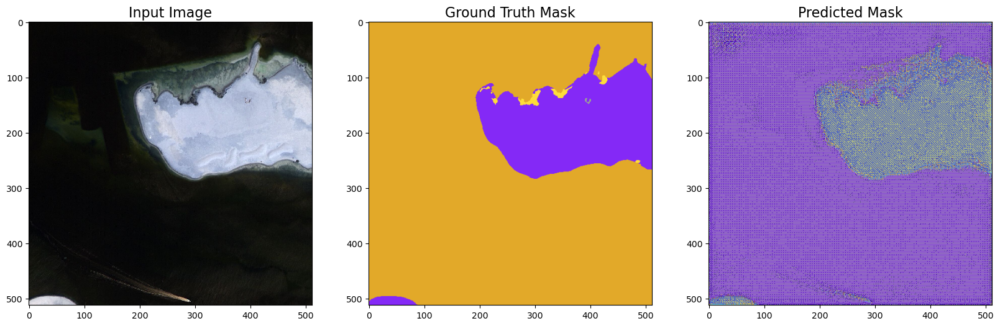

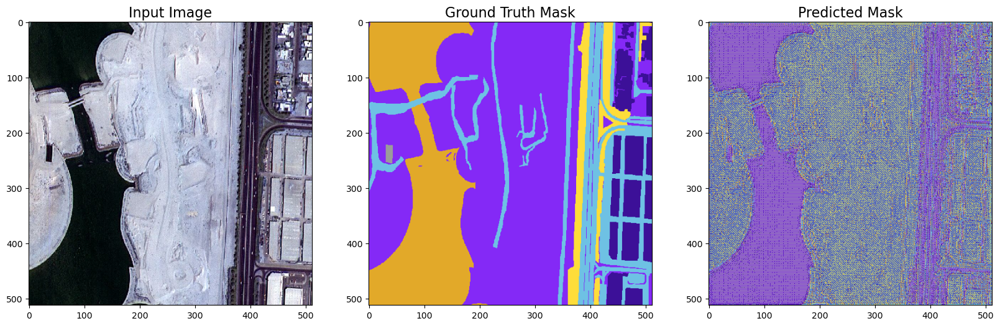

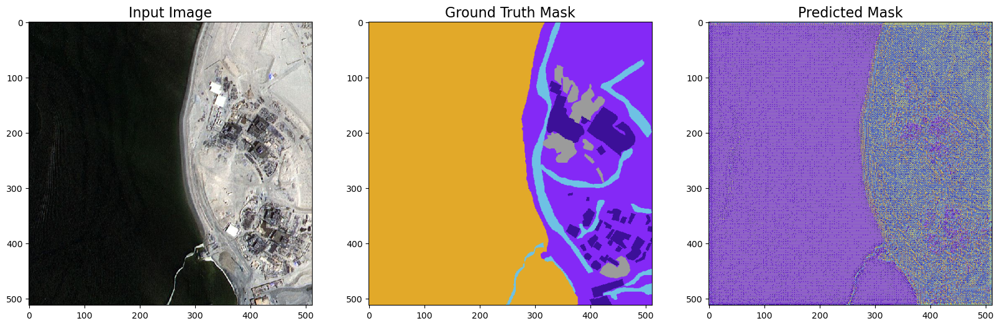

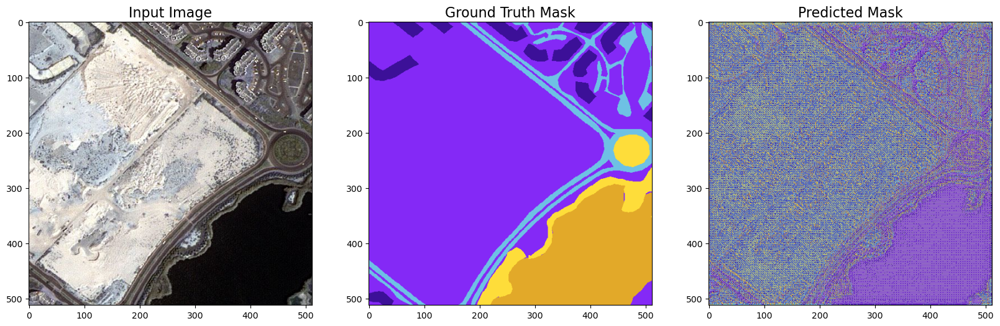

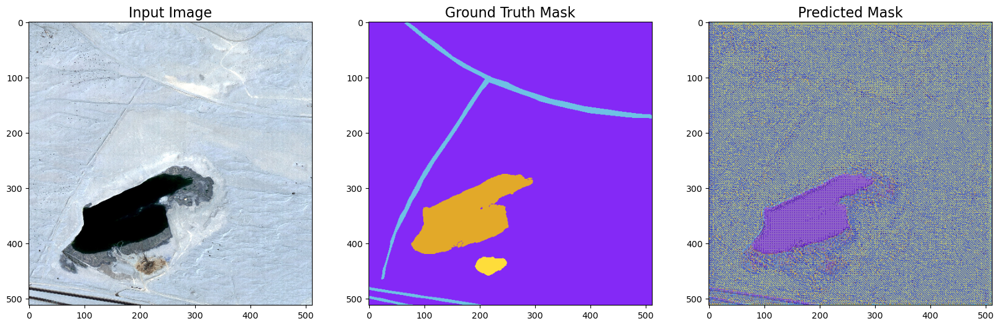

1/1 [==============================] - 2s 2s/step


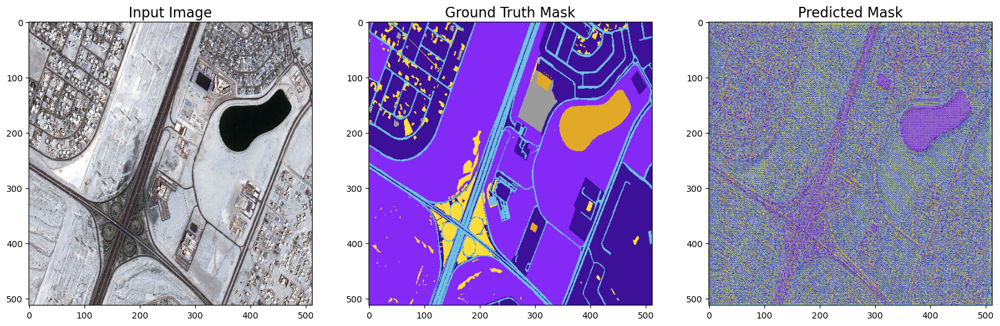

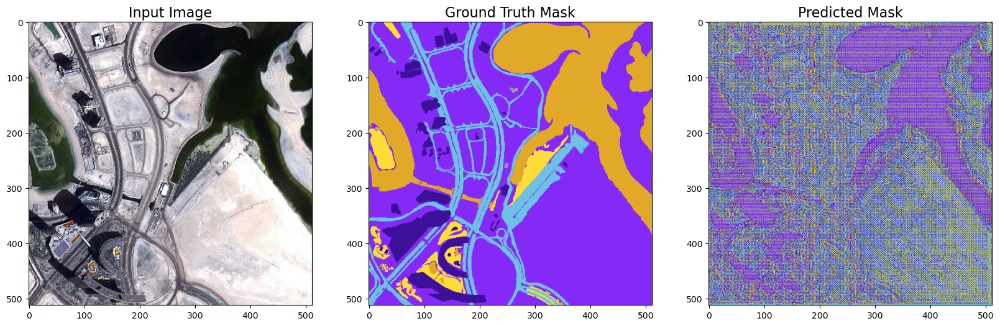

In [38]:
count = 0
for i in range(2):
    batch_img,batch_mask = next(testing_gen)
    pred_all= model.predict(batch_img)
    np.shape(pred_all)
    
    for j in range(0,np.shape(pred_all)[0]):
        count += 1
        fig = plt.figure(figsize=(20,8))

        ax1 = fig.add_subplot(1,3,1)
        ax1.imshow(batch_img[j])
        ax1.set_title('Input Image', fontdict={'fontsize': 16, 'fontweight': 'medium'})
        ax1.grid(False)

        ax2 = fig.add_subplot(1,3,2)
        ax2.set_title('Ground Truth Mask', fontdict={'fontsize': 16, 'fontweight': 'medium'})
        ax2.imshow(onehot_to_rgb(batch_mask[j],id2code))
        ax2.grid(False)

        ax3 = fig.add_subplot(1,3,3)
        ax3.set_title('Predicted Mask', fontdict={'fontsize': 16, 'fontweight': 'medium'})
        ax3.imshow(onehot_to_rgb(pred_all[j],id2code))
        ax3.grid(False)

        plt.savefig('./predictions/prediction_{}.png'.format(count), facecolor= 'w', transparent= False, bbox_inches= 'tight', dpi= 200)
        plt.show()

In [ ]:
!zip -r predictions.zip "./predictions"

In [ ]:
!rm -rf './predictions/'